# Importación de Datos

In [239]:
import pandas as pd
from pandas_profiling import ProfileReport
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from fancyimpute import KNN
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.linear_model import Lasso




In [240]:
df=pd.read_csv("C:/Users/Sebastián/Downloads/gapminder_final.csv")
df.head()

,country,incomeperperson,alcconsumption,armedforcesrate,breastcancerper100th,co2emissions,femaleemployrate,hivrate,internetuserate,lifeexpectancy,oilperperson,polityscore,relectricperperson,suicideper100th,employrate,urbanrate
0,Ireland,27595.091350,14.92,0.450024,74.9,1.633779e+09,51.000000,0.2,69.770394,80.557,1.700262,10.0,2051.802338,10.365070,59.900002,61.34
1,Albania,1914.996551,7.29,1.024736,57.4,2.237473e+08,42.099998,NaN,44.989947,76.918,NaN,9.0,636.341383,7.699330,51.400002,46.72
2,Central African Rep.,239.518749,3.17,0.148659,16.5,8.338000e+06,62.900002,4.7,2.300027,48.398,NaN,-1.0,NaN,13.548420,71.300003,38.58
3,Barbados,9243.587053,6.42,0.663956,62.5,3.616067e+07,60.299999,1.4,70.028599,76.835,NaN,NaN,NaN,3.108603,66.900002,39.84
4,Italy,18982.269290,9.72,1.729346,74.4,1.900045e+10,35.799999,0.3,53.740217,81.855,1.207250,10.0,1176.385457,4.930045,46.400002,68.08


In [241]:
df2= pd.read_csv("C:/Users/Sebastián/Downloads/paises_categorizados.csv")
df2
df=df.merge(df2, how='left',on='country')
df=df.drop_duplicates()

# EDA

In [242]:
df.shape

(166, 19)

Tenemos 166 datos con 16 variables (1 target) y 3 categoricas

In [243]:
df.isnull().sum()

country                   0
incomeperperson           3
alcconsumption            0
armedforcesrate           4
breastcancerper100th      1
co2emissions              2
femaleemployrate          1
hivrate                  22
internetuserate           3
lifeexpectancy            0
oilperperson            105
polityscore              10
relectricperperson       36
suicideper100th           0
employrate                1
urbanrate                 0
Continente                0
Desarrollo                0
Estabilidad               0
dtype: int64

Campos como oilperperson y relectricperperson no parecen ser muy útiles pues tienen muchos valores nulos o faltantes.

In [244]:
profile = ProfileReport(df, title="Pandas Profiling")
profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [245]:
df.nunique()

country                 166
incomeperperson         163
alcconsumption          159
armedforcesrate         162
breastcancerper100th    133
co2emissions            164
femaleemployrate        145
hivrate                  46
internetuserate         163
lifeexpectancy          164
oilperperson             61
polityscore              21
relectricperperson      129
suicideper100th         166
employrate              132
urbanrate               163
Continente                7
Desarrollo                3
Estabilidad               4
dtype: int64

Al eliminar duplicados obtenemos solo 166 valores es decir que realmente el dataset solo contiene 166 paises para hacer el entrenamiento y el testeo del modelo. 

Campos como country, o suicideper100th no serán variables útiles por lo que las eliminaremos. No son útiles pues siempre son diferentes.

<Axes: title={'center': 'Distribución PIB per Capita'}, xlabel='incomeperperson', ylabel='Count'>

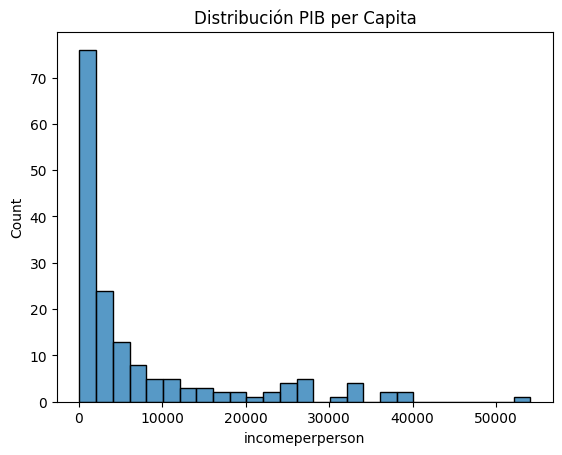

In [246]:
plt.title('Distribución PIB per Capita')
sns.histplot(df,x='incomeperperson', binwidth=2000)

Vemos una amplia concentración de los datos target en valores de PIB per capita entre 0 y 4000 USD por año. Esto hace sentido pues la mayoría de los países están en desarrollo. Se ve claramente outliers en valores por encima de los 36K USD.

<Axes: >

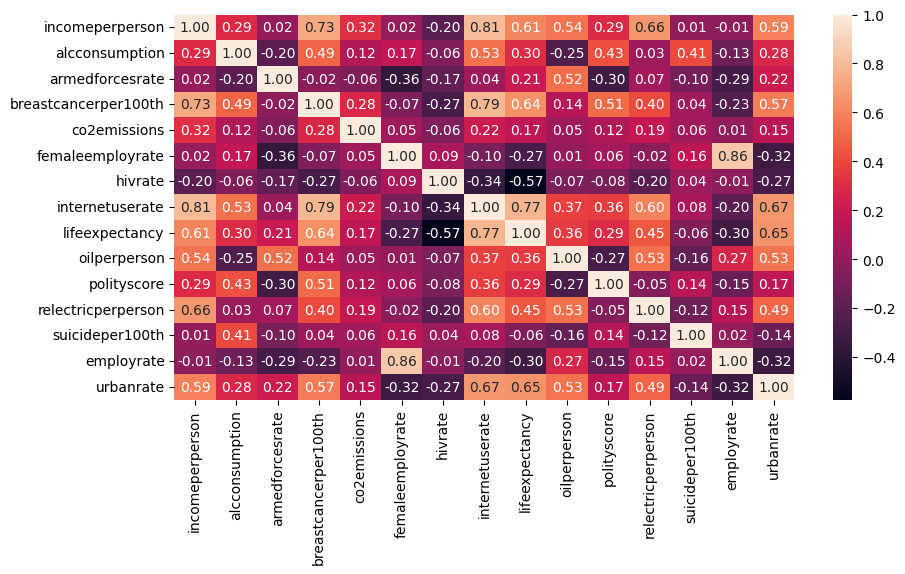

In [247]:
plt.figure(figsize=(10,5))
sns.heatmap(df.select_dtypes(include=['number']).corr(), annot=True,fmt='.2f')

La anterior gráfica de correlación nos muestra una fuerte correlación con breastcancerper100th (0.73), co2emissions (0.32), internetuserrate(0.81), lifeexpectancy (0.61), reelectricperperson (0.66) y finalmente urbanrate(0.59). Estas son variables que exploraremos a profundidad para ver el impacto que tienen sobre la variable target que nuevamente es incomeperperson.

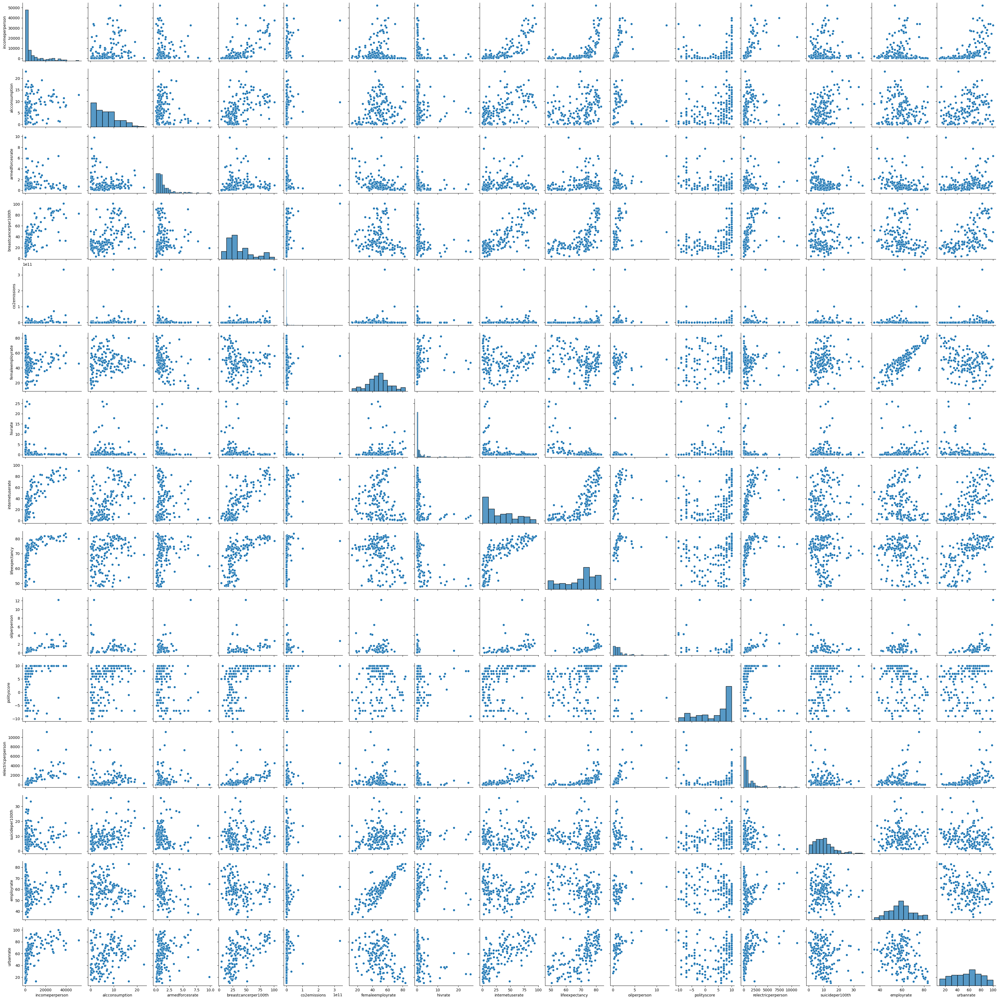

In [248]:
sns.pairplot(df)

Esta gráfica refleja la misma conclusión previa, donde vemos una correlación marcada en las 6 variables previamente mencionadas.

<Axes: title={'center': 'Dispersión entre PIB per capita y cancer de seno'}, xlabel='breastcancerper100th', ylabel='incomeperperson'>

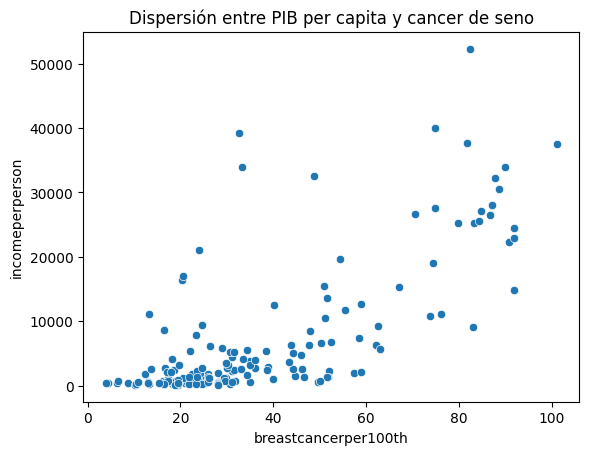

In [249]:
plt.title('Dispersión entre PIB per capita y cancer de seno')
sns.scatterplot(df,x='breastcancerper100th',y='incomeperperson')

Se puede observar una clara relación entre el PIB y el cancer de seno. A mayor cancer de seno parece que en general hay un mayor PIB per capita

<Axes: title={'center': 'Dispersión entre PIB per capita y emisiones de CO2'}, xlabel='co2emissions', ylabel='incomeperperson'>

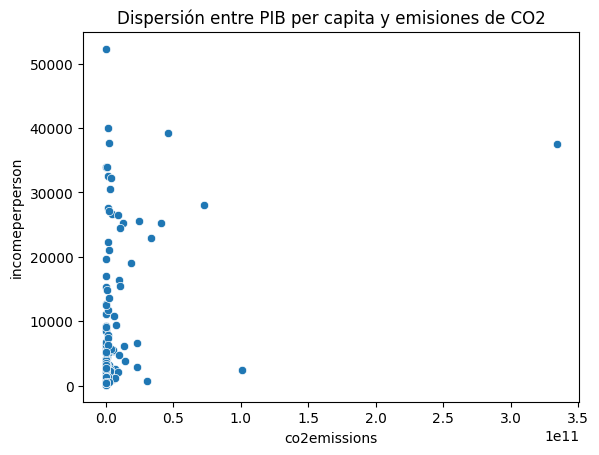

In [250]:
plt.title('Dispersión entre PIB per capita y emisiones de CO2')
sns.scatterplot(df,x='co2emissions',y='incomeperperson')

A mayor cantidad de emisiones no se ve un incremento drastico en la variable de PIB per capita

<Axes: title={'center': 'Dispersión entre PIB per capita y uso de internet'}, xlabel='internetuserate', ylabel='incomeperperson'>

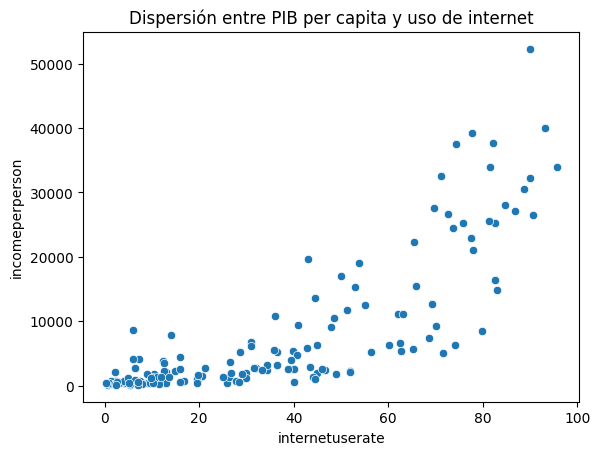

In [251]:
plt.title('Dispersión entre PIB per capita y uso de internet')
sns.scatterplot(df,x='internetuserate',y='incomeperperson')

A mayor cantidad de uso de internet se ve un claro incremento en el PIB per capita

<Axes: title={'center': 'Dispersión entre PIB per capita y expectativa de vida'}, xlabel='lifeexpectancy', ylabel='incomeperperson'>

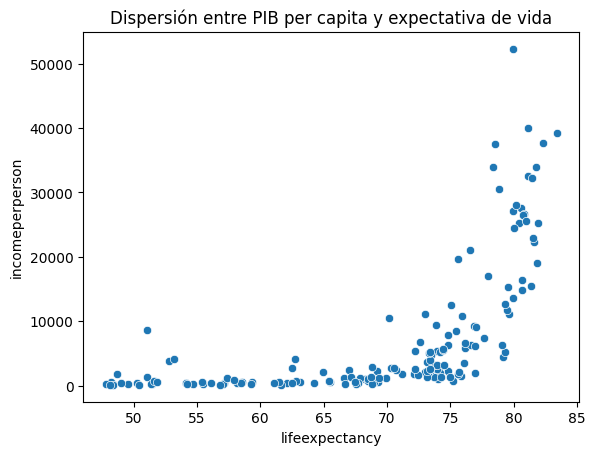

In [252]:
plt.title('Dispersión entre PIB per capita y expectativa de vida')
sns.scatterplot(df,x='lifeexpectancy',y='incomeperperson')

A mayor expectativa de vida se ve un claro aumento de PIB per capita

<Axes: title={'center': 'Dispersión entre PIB per capita y red eléctrica'}, xlabel='relectricperperson', ylabel='incomeperperson'>

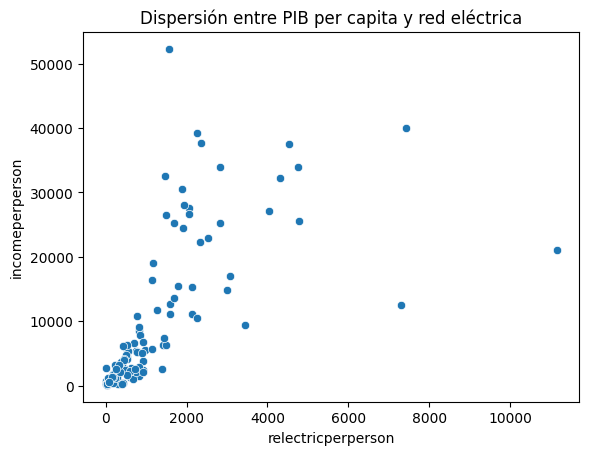

In [253]:
plt.title('Dispersión entre PIB per capita y red eléctrica')
sns.scatterplot(df,x='relectricperperson',y='incomeperperson')

A mayor cantidad de red electrica hay un aumento significativo en el PIB per capita

<Axes: title={'center': 'Dispersión entre PIB per capita y zonas urbanas'}, xlabel='urbanrate', ylabel='incomeperperson'>

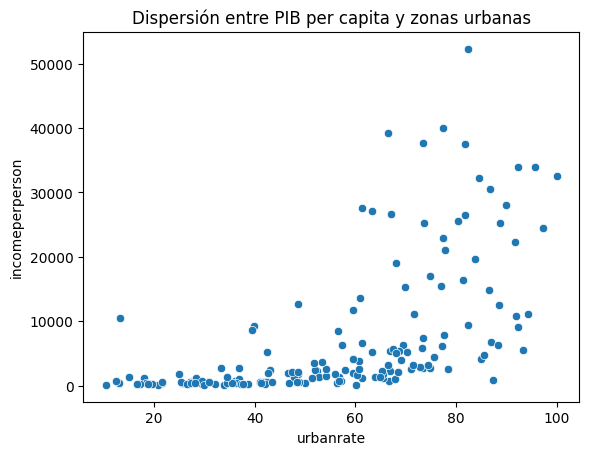

In [254]:
plt.title('Dispersión entre PIB per capita y zonas urbanas')
sns.scatterplot(df,x='urbanrate',y='incomeperperson')

A medida que hay un incremento en la urbanización se tiende a observar un incremento en el PIB

<Axes: title={'center': 'PIB Promedio por Continente'}, xlabel='Continente', ylabel='incomeperperson'>

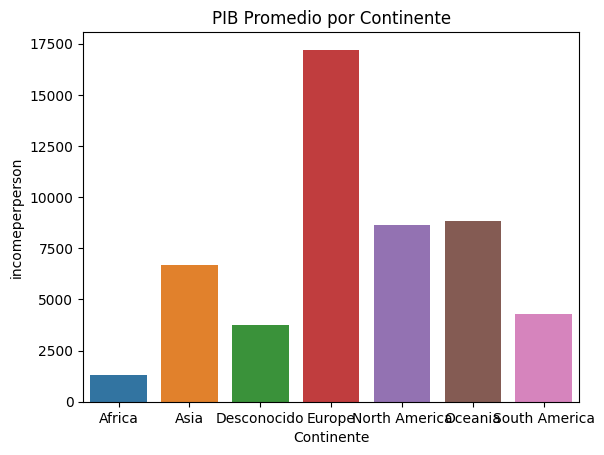

In [255]:
plt.title('PIB Promedio por Continente')
sns.barplot(df.groupby('Continente')['incomeperperson'].mean().reset_index(),x='Continente', y='incomeperperson')

Se puede observar un claro incremento en el PIB promedio en continentes que contienen paises mas ricos y desarrollados como Europa y Norte America.

<Axes: title={'center': 'PIB Promedio por Estabilidad Política y Social'}, xlabel='Estabilidad', ylabel='incomeperperson'>

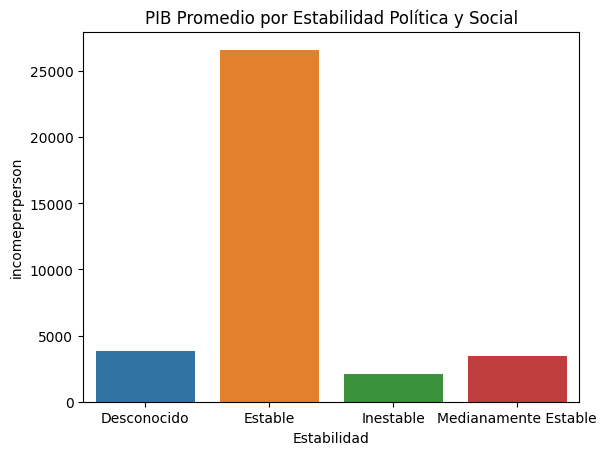

In [256]:
plt.title('PIB Promedio por Estabilidad Política y Social')
sns.barplot(df.groupby('Estabilidad')['incomeperperson'].mean().reset_index(),x='Estabilidad', y='incomeperperson')

Se puede observar que la estabilidad politica tambien parece influir significativamente en el PIB de los paises.

<Axes: title={'center': 'PIB Promedio por Desarrollo'}, xlabel='Desarrollo', ylabel='incomeperperson'>

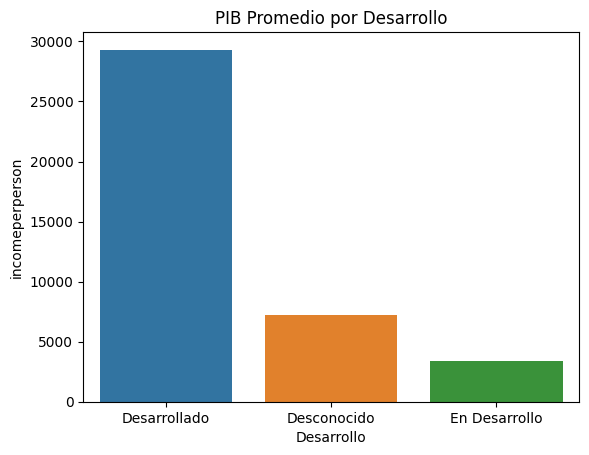

In [257]:
plt.title('PIB Promedio por Desarrollo')
sns.barplot(df.groupby('Desarrollo')['incomeperperson'].mean().reset_index(),x='Desarrollo', y='incomeperperson')

Claramente se puede observar que paises desarrollados tienden a tener un PIB mucho mayor a aquellos que se encuentran en desarrollo.

# Preparación de Datos

In [258]:

features=['relectricperperson','internetuserate','lifeexpectancy','urbanrate','breastcancerper100th','incomeperperson','Continente','Desarrollo','Estabilidad']
df=df[features]
to_get_dummies_for = ['Continente','Estabilidad','Desarrollo']


df = pd.get_dummies(data = df, columns = to_get_dummies_for, drop_first = True)      

knn_imputer = KNN(k=5) 
df_imputed = pd.DataFrame(knn_imputer.fit_transform(df))
df_imputed.columns = df.columns

Imputing row 1/166 with 0 missing, elapsed time: 0.023
Imputing row 101/166 with 0 missing, elapsed time: 0.025


En el código previo lo que hacemos es hacer un one hot para variables categóricas y adicionalmente seleccionamos las variables input del modelo. Adicionalmente hacemos KNN imputing para valores faltantes.

In [259]:
Q1 = df_imputed['incomeperperson'].quantile(0.25)
Q3 = df_imputed['incomeperperson'].quantile(0.75)
IQR = Q3 - Q1

# Removemos outliers
df_imputed = df_imputed[
    (df_imputed['incomeperperson'] >= (Q1 - 2 * IQR)) & 
    (df_imputed['incomeperperson'] <= (Q3 + 2 * IQR))
]

Y = df_imputed.incomeperperson
X = df_imputed.drop(columns = ['incomeperperson'])

El código previo remueve outliers y separa las variables explicativas (X) de las variables target (Y)

In [260]:
#Estandarizamos datos para construcción de modelo
sc = StandardScaler()
X_scaled = sc.fit_transform(X)
X_scaled = pd.DataFrame(X_scaled, columns = X.columns)

In [261]:
#Dividimos el dataset entre entramiento y test
x_train, x_test, y_train, y_test = train_test_split(X_scaled, Y, test_size = 0.2, random_state = 1)


# Construcción de Modelo

In [262]:
model = LinearRegression()
model.fit(x_train, y_train)

LinearRegression()

In [263]:
for feature, coef in zip(X.columns, model.coef_):
    print(f"{feature}: {coef}")

relectricperperson: 1945.4932760094332
internetuserate: 1361.8720377603609
lifeexpectancy: 559.3240301554275
urbanrate: 392.15796109448155
breastcancerper100th: 313.23792019506817
Continente_Asia: -487.36600092322357
Continente_Desconocido: -563.070114852678
Continente_Europe: -475.8387700382251
Continente_North America: -94.61195719738163
Continente_Oceania: -463.19037201061474
Continente_South America: -413.5524092023595
Estabilidad_Estable: 294.9746924934252
Estabilidad_Inestable: 100.51112976115178
Estabilidad_Medianamente Estable: -105.15873239669455
Desarrollo_Desconocido: -1469.063539400264
Desarrollo_En Desarrollo: -2573.459721010241


Lo anterior muestra los coeficientes de la regresión lineal construida

In [264]:
model.intercept_


3969.26215388097

Vemos el intercepto del modelo

# Evaluación del Modelo

In [265]:
#Obtenemos outputs del modelo
preds_train = model.predict(x_train)
preds_test = model.predict(x_test)

In [266]:
print("MAE train:", mean_absolute_error(y_train, preds_train))
print("MAE test:", mean_absolute_error(y_test, preds_test))

MAE train: 1572.316437786202
MAE test: 2559.854105962308


In [267]:
print("RMSE train:", np.sqrt(mean_squared_error(y_train, preds_train)))
print("RMSE test:", np.sqrt(mean_squared_error(y_test, preds_test)))

RMSE train: 2311.176414148814
RMSE test: 3731.7380841983622


In [268]:
print("R2 score:", r2_score(y_train, preds_train))
print("R2 score:", r2_score(y_test, preds_test))


R2 score: 0.7899459735318419
R2 score: 0.4516183282343208


En las tres métricas de error evaluadas se puede observar un claro overfit en el entrenamiento de los datos esto dado que el error de entrenamiento es considerablemente menor al error de prueba. Sin embargo, los errores son aceptables, considerando la escala de los datos entre 0 y 50,000 USD.

# Evaluación de supuestos

### Colinealidad

<Axes: >

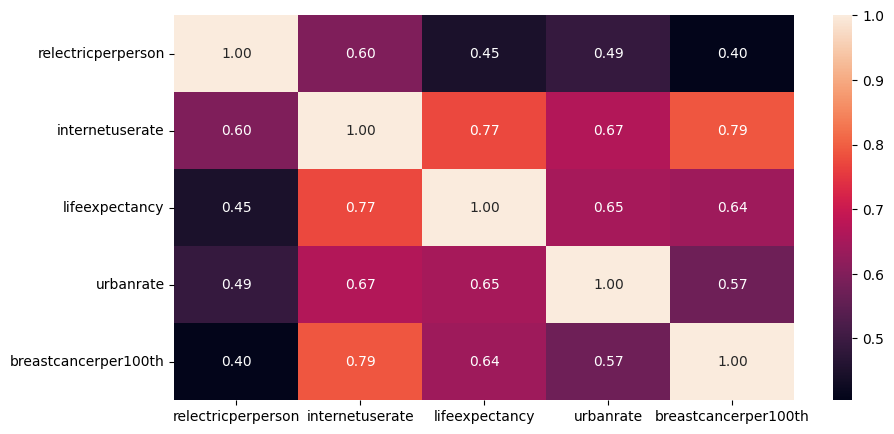

In [269]:
plt.figure(figsize=(10,5))
sns.heatmap(df.loc[:,['relectricperperson','internetuserate','lifeexpectancy','urbanrate','breastcancerper100th']].select_dtypes(include=['number']).corr(), annot=True,fmt='.2f')

Lo primero que revisamos es si no hay una colinealidad (correlación entre variables), hay variables con correlaciones considerablemente grandes pero que no sobrepasan el threshold de 0.8 planteado. Por esta razón podemos concluir que no hay colinealidad en los datos usados.

### Linealidad

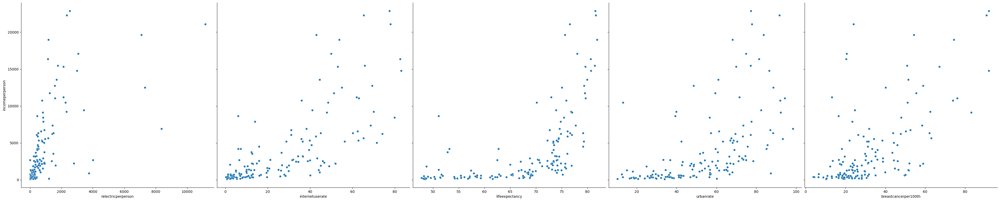

In [270]:
sns.pairplot(pd.concat([X, Y], axis=1), height=8, y_vars="incomeperperson", x_vars=['relectricperperson','internetuserate','lifeexpectancy','urbanrate','breastcancerper100th'], kind="scatter")

Como lo vimos en la etapa del EDA se ve una relacion lineal entre las variables input y la target feature.

### Homocedasticidad

<Axes: >

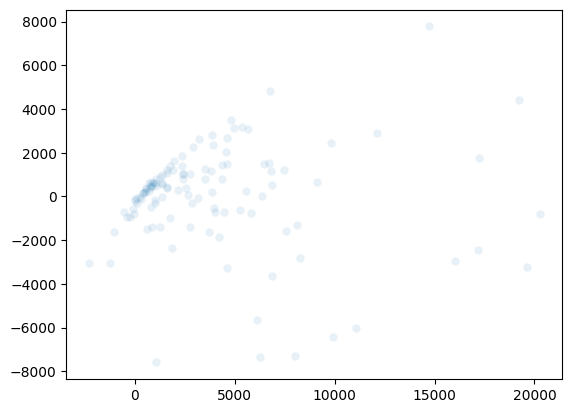

In [271]:
errors = (model.predict(x_train)-y_train).values
sns.scatterplot(x = model.predict(x_train), y=errors, alpha=0.1)

Se puede observar que los errores no se centran alrededor del cero que es lo que buscamos. Sin embargo, vemos rastros de heteroscedasticidad, es decir que la varianza del error va aumentando a medida que el PIB de los paises aumenta. Para solucionar esto intentaremos evaluar el modelo con transformaciones no lineales.

### Normalidad de Errores

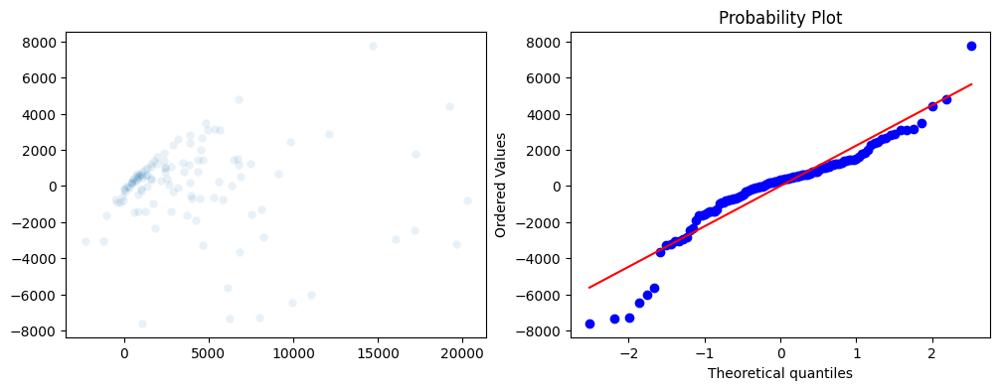

In [272]:
import scipy.stats as stats

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

#
sns.scatterplot(x=model.predict(x_train), y=errors, alpha=0.1, ax=axes[0])

# q-q plot
_ = stats.probplot(errors, dist="norm", plot=axes[1])

Como se puede ver en el gráfico de la derecha los errores se comportan como una curva normal, es decir que no tienen una media en cero y no hay un skweness ni curtosis marcado en los errores.

# Regularización

In [273]:
lasso = Lasso(alpha=0.1)

lasso.fit(x_train, y_train)

preds_train = lasso.predict(x_train)
preds_test = lasso.predict(x_test)

print("MAE train:", mean_absolute_error(y_train, preds_train))
print("MAE test:", mean_absolute_error(y_test, preds_test))

MAE train: 1572.3136462843227
MAE test: 2559.785315424526


In [274]:
from sklearn.linear_model import Ridge

ridge = Ridge(alpha=0.1)

ridge.fit(x_train, y_train)

y_pred = ridge.predict(x_test)

preds_train = lasso.predict(x_train)
preds_test = lasso.predict(x_test)

print("MAE train:", mean_absolute_error(y_train, preds_train))
print("MAE test:", mean_absolute_error(y_test, preds_test))

MAE train: 1572.3136462843227
MAE test: 2559.785315424526


In [288]:
y_log = np.log(Y+0.1)
x_log = np.log(X+0.1)
x_train, x_test, y_train, y_test = train_test_split(x_log, y_log, test_size = 0.2, random_state = 1)

model = LinearRegression().fit(x_train, y_train)


# Predicciones (si las necesitas)
y_pred = np.exp(model.predict(x_test))


print("MAE test:", mean_absolute_error(y_test, y_pred))


MAE test: 3143.008466332397


Se intentaron varias técnicas de regularización con resultados no muy prometedores.

# Conclusiones

* Como lo observamos desde el principio las variables mas relevantes fueron las seleccionadas. Algo para recalcar es que son pocos datos menos de 150 para entrenamiento y el restante para evaluar. Esta es la principal razón por la cual el modelo termina haciendo un overfit durante su entrenamiento. Esto fue evidente puesto que el MAE de entrenamiento fue menor a el MAE de prueba. Adicionalmente, se intentaron aplicar diferentes tecnicas de regularizacion como L1, L2 e incluso transformacion logarítmica. Sin embargo, el overfit no se logró reducir considerablemente. Como próximos pasos buscaría la inclusión de nuevas variables explicativas y adicionalmente buscaría recolectar más datos de más países para que así el modelo pueda aprender mejor a diferenciar el ruido de la señal.

* El MAE del modelo fue de entrenamiento fue de 1,572 USD y el MAE de entrenamiento de 2,559 USD. Hay una diferencia considerable. Sin embargo, es importante recalcar que el error es bueno, tomando el error de la prueba y la escala de los datos (aproximadamente 50K USD), vemos que el error es +- 5% de la escala, lo que concluimos como un error aceptable.

*  Dado que hicimos una transformación a los datos se pierde un poco la interpretabilidad de las variables. Sin embargo,hablando un poco sobre los coeficientes del modelo tenemos que las variables mas importantes y con considerable ventaja son relectripeperson y internetuserrate, un incremento en estas variables llevaría a un incremento considerable del PIB per capita. Por otro lado, variables como estar en desarrollo desconocido o ser un país en desarrollo son variables que afectan negativamente el PIB per capita de un país. Por último, es importante interpretar el intercepto del modelo que es de 3,969 USD. Este valor, al ser transformado, refleja el promedio del PIB de un país.

* Para poder mejorar el PIB mi recomendación de políticas públicas se enfocaría en el desarrollo tecnológico. Esto pues esto impactaría las principales variables que impactan el PIB que sería el consumo energético y adicionalmente el uso del internet. La estrategia tendría varios frentes, principalmente desde la educación enfocada en la tecnología. Por ejemplo, se podría incentivar el estudiar carreras tecnológicas lo que llevaría a un mayor uso de internet y a su vez también al consumo de energía. Por otro lado, la estrategia se enfocaría en mejorar los sistemas de salud, ya que esto mejoraría la expectativa de vida llevando probablemente a un mayor PIB del país. Finalmente, incentivaría industria urbana controlada y sostenible para aumentar la urbanización en el país, reflejandose en un mayor PIB. 